## Load Packages

In [1]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D  # <-- added import

import numpy as np
import seaborn as sns
import math
import bayesflow as bf
import os
from numba import njit
from sklearn.preprocessing import StandardScaler
import numba as nb
import copy
import random
from tensorflow.keras import backend as K
import gc
from pathlib import Path
from tensorflow.keras.utils import to_categorical
from tensorflow_probability import distributions as tfd
import tensorflow as tf
import ipynbname
RNG = np.random.default_rng(2023)
from tqdm.autonotebook import tqdm
from diffusion_functions import diffusion_trial, diffusion_prior, diffusion_prior_realistic, generate_condition_matrix, diffusion_configurator

# Suppress scientific notation for floats
np.set_printoptions(suppress=True)



C:\ProgramData\miniconda3\Lib\site-packages\bayesflow\trainers.py:27: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## Get file path

In [2]:
notebook_path = Path(ipynbname.path()).resolve().parent
root_dir = notebook_path.parent
#print(root_dir)

## Define checkpoint

In [3]:
checkpoint_path =  root_dir/ "networks/standard"

checkpoint_path_uniform = root_dir/ "networks/uniform"
checkpoint_path_t_df1 = root_dir/ "networks/t_df1"
checkpoint_path_t_df3 = root_dir/ "networks/t_df3"
checkpoint_path_t_df5 = root_dir/ "networks/t_df5"

checkpoint_path_001 = root_dir/ "networks/contamination probability/pi=0.01"
checkpoint_path_005 = root_dir/ "networks/contamination probability/pi=0.05"
checkpoint_path_010 = root_dir/ "networks/contamination probability/pi=0.10"
checkpoint_path_020 = root_dir/ "networks/contamination probability/pi=0.20"

## Set up prior and condition matrix

In [4]:
PARAM_NAMES = [
    r'$v_1$',
    r'$v_2$',
    r'$a$',
    r'$z$',
    r'$T_{er}$'
]

prior = bf.simulation.Prior(prior_fun=diffusion_prior, param_names=PARAM_NAMES)

MIN_OBS = 100
MAX_OBS = 1000
NUM_CONDITIONS=2

def random_num_obs(min_obs=MIN_OBS, max_obs=MAX_OBS):
    """Draws a random number of observations for all simulations in a batch."""

    return 200

context_gen = bf.simulation.ContextGenerator(
    non_batchable_context_fun=random_num_obs,
    batchable_context_fun=generate_condition_matrix,
    use_non_batchable_for_batchable=True
)

## Set up DDM model and estimator

### Standard estimator

In [5]:
@nb.jit(nopython=True)
def diffusion_experiment(theta, design_matrix, num_obs, rng=None, *args):
    
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
        
    out[:,0] = np.log(out[:,0])
    
    return out

simulator = bf.simulation.Simulator(simulator_fun=diffusion_experiment, context_generator=context_gen)

model = bf.simulation.GenerativeModel(prior=prior, simulator=simulator)

summary_net = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

inference_net = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer = bf.amortizers.AmortizedPosterior(inference_net, summary_net)

trainer = bf.trainers.Trainer(
    generative_model=model, amortizer=amortizer, configurator=diffusion_configurator
    ,checkpoint_path = checkpoint_path
)
amortizer.summary()

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\standard\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desk

Model: "amortized_posterior"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer (SetTransf  multiple                  46544     
 ormer)                                                          
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (t, df=1)

In [6]:
@nb.jit(nopython=True)

def diffusion_experiment_contaminated_t_df1(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_t_df1 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_t_df1, context_generator=context_gen)

model_t_df1 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_t_df1)

#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_t_df1 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_t_df1 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_t_df1 = bf.amortizers.AmortizedPosterior(inference_net_t_df1, summary_net_t_df1)


trainer_t_df1 = bf.trainers.Trainer(
    generative_model=model_t_df1, amortizer=amortizer_t_df1, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_t_df1
)
amortizer_t_df1.summary()

#history = trainer_c_t_df1.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\t_df1\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desktop

Model: "amortized_posterior_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_1 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (t, df=3)

In [7]:
@nb.jit(nopython=True)

def diffusion_experiment_contaminated_t_df3(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=3,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_t_df3 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_t_df3, context_generator=context_gen)

model_t_df3 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_t_df3)

#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_t_df3 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_t_df3 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_t_df3 = bf.amortizers.AmortizedPosterior(inference_net_t_df3, summary_net_t_df3)


trainer_t_df3 = bf.trainers.Trainer(
    generative_model=model_t_df3, amortizer=amortizer_t_df3, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_t_df3
)
amortizer_t_df3.summary()

#history = trainer_c_t_df3.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\t_df3\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desktop

Model: "amortized_posterior_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_2 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (t, df=5)

In [8]:
@nb.jit(nopython=True)

def diffusion_experiment_contaminated_t_df5(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=5,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_t_df5 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_t_df5, context_generator=context_gen)

model_t_df5 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_t_df5)

#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_t_df5 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_t_df5 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_t_df5 = bf.amortizers.AmortizedPosterior(inference_net_t_df5, summary_net_t_df5)


trainer_t_df5 = bf.trainers.Trainer(
    generative_model=model_t_df5, amortizer=amortizer_t_df5, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_t_df5
)
amortizer_t_df5.summary()

#history = trainer_c_t_df5.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\t_df5\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desktop

Model: "amortized_posterior_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_3 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (U(0,20))

In [9]:
@nb.jit(nopython=True,parallel=True)
def diffusion_experiment_contaminated_uniform(theta, design_matrix, num_obs, rng=None, *args):
    
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.uniform(0,20,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(CC)
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_uniform = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_uniform, context_generator=context_gen)

model_uniform = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_uniform)

summary_net_uniform = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_uniform = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_uniform = bf.amortizers.AmortizedPosterior(inference_net_uniform, summary_net_uniform)


trainer_uniform = bf.trainers.Trainer(
    generative_model=model_uniform, 
    amortizer=amortizer_uniform, 
    configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_uniform
)
amortizer_uniform.summary()

#history = trainer_c_uniform.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\uniform\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Deskt

Model: "amortized_posterior_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_4 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


## Visualization of reaction time data and contamination distribution

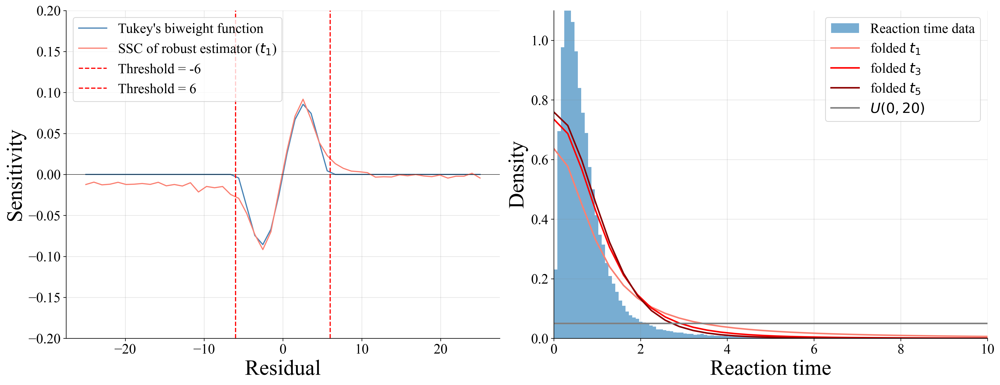

In [86]:
import matplotlib.pyplot as plt
import numpy as np
x_vals = np.linspace(-25, 25, 50)
%store -r infl_df1_tukey
# Assuming the following are already defined and loaded:
# x_vals, infl_df1_tukey, sim_data, n, x, pdf_df1, pdf_df3, pdf_df5, pdf_uniform, root_dir

#simulate 1000 data sets from the standard model
n=1000
sim_data = model(n)

from scipy.stats import t
from scipy.stats import uniform
x = np.linspace(0,
                t.ppf(0.99, 1), 100)
pdf_df1 = t.pdf(x, 1, loc=0, scale=1)
pdf_df3 = t.pdf(x, 3, loc=0, scale=1)
pdf_df5 = t.pdf(x, 5, loc=0, scale=1)

pdf_uniform = uniform.pdf(x,loc=0,scale=20)

def tukey_biweight_influence_function(x, k):
    influence = np.zeros_like(x)
    mask = np.abs(x) <= k
    influence[mask] = (x[mask] * (1 - (x[mask] / k)**2)**2) / 20
    return influence

k = 6
influence_vals = tukey_biweight_influence_function(x_vals, k)

plt.rcParams['font.family'] = 'Times New Roman'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), dpi=300)

# --- Left plot: Tukey biweight influence function ---
ax1.plot(x_vals, influence_vals, label=r"Tukey's biweight function", color='steelblue')
ax1.plot(x_vals, infl_df1_tukey, label=r"SSC of robust estimator ($t_1$)", color='salmon')
ax1.axhline(0, color='black', linewidth=0.5)
ax1.axvline(-k, color='red', linestyle='--', label=f'Threshold = -{k}')
ax1.axvline(k, color='red', linestyle='--', label=f'Threshold = {k}')

ax1.set_xlabel('Residual', fontsize=28)
ax1.set_ylabel('Sensitivity', fontsize=28)
ax1.set_ylim(-0.2, 0.2)
ax1.grid(color='grey', linestyle='-', alpha=0.2)

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

ax1.tick_params(axis='x', labelsize=18)
ax1.tick_params(axis='y', labelsize=18)

ax1.legend(fontsize=18)

# --- Right plot: Histogram + PDFs ---
# Flatten sim_data for histogram
rt_data = np.exp(sim_data['sim_data'][:,:,0].reshape(200*n,))

ax2.hist(rt_data, bins=200, density=True, alpha=0.6, histtype='stepfilled', label='Reaction time data')

ax2.plot(x, 2*pdf_df1, lw=2, color='salmon', label=r'folded $t_1$')
ax2.plot(x, 2*pdf_df3, lw=2, color='red', label=r'folded $t_3$')
ax2.plot(x, 2*pdf_df5, lw=2, color='darkred', label=r'folded $t_5$')
ax2.plot(x, pdf_uniform, lw=2, color='grey', label='$U(0,20)$')

ax2.set_xlim(0, 10)
ax2.set_ylim(0, 1.1)

ax2.set_xlabel('Reaction time', fontsize=28)
ax2.set_ylabel('Density', fontsize=28)

ax2.grid(color='grey', linestyle='-', alpha=0.2)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax2.tick_params(axis='x', labelsize=18)
ax2.tick_params(axis='y', labelsize=18)

ax2.legend(fontsize=18)

plt.tight_layout()
#plt.savefig("C:/Users/u0145642/OneDrive - KU Leuven/Desktop/submission-Robust ABI/revision/yw_2025_fig7.pdf", format="pdf", bbox_inches="tight")
plt.show()


## Parameter recovery

### Standard estimator

Estimation will be performed on data sets with 200 simulated trials.


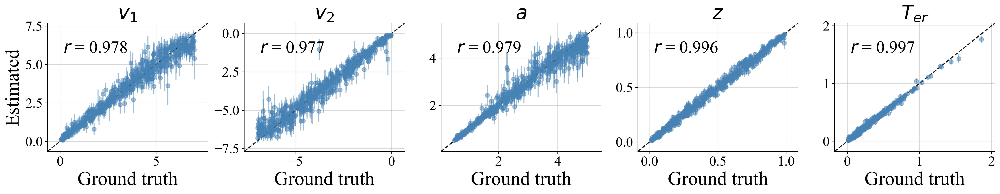

In [12]:
# Generate some validation data
validation_sims = diffusion_configurator(model(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='steelblue',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM.pdf", format="pdf", bbox_inches="tight")


### Robust estimator (t, df=1)

Estimation will be performed on data sets with 200 simulated trials.


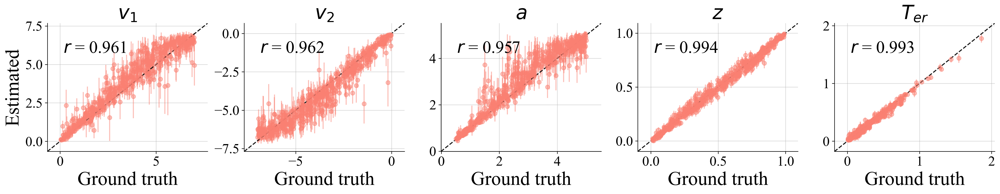

In [13]:
# Generate some validation data
#validation_sims = diffusion_configurator(model(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_t_df1.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='salmon',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_robust_df1.pdf", format="pdf", bbox_inches="tight")


### Robust estimator (t, df=3)

Estimation will be performed on data sets with 200 simulated trials.


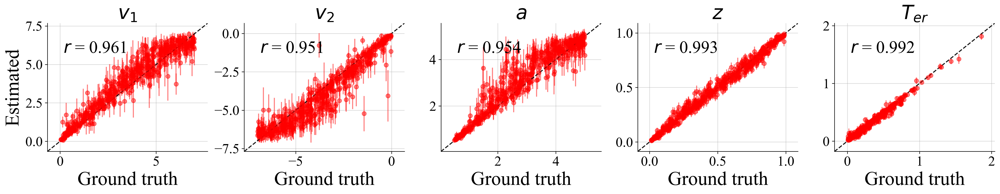

In [14]:
# Generate some validation data
#validation_sims = diffusion_configurator(model(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_t_df3.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='red',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_robust_df3.pdf", format="pdf", bbox_inches="tight")


### t df=5

Estimation will be performed on data sets with 200 simulated trials.


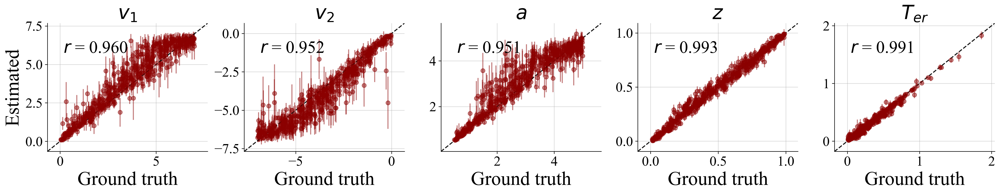

In [15]:
# Generate some validation data
#validation_sims = diffusion_configurator(model(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_t_df5.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='darkred',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_robust_df5.pdf", format="pdf", bbox_inches="tight")


### Uniform

Estimation will be performed on data sets with 200 simulated trials.


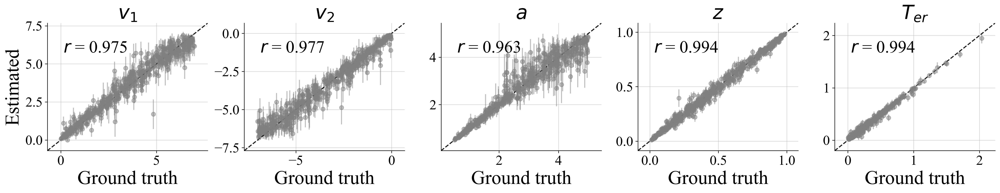

In [16]:
# Generate some validation data
validation_sims = diffusion_configurator(model(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_uniform.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='grey',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_robust_uniform.pdf", format="pdf", bbox_inches="tight")


In [ ]:
import fitz  # PyMuPDF

pdf_files = [
    root_dir/"plots/parameter_recovery_DDM.pdf",
    root_dir/"plots/parameter_recovery_DDM_robust_df1.pdf",
    root_dir/"plots/parameter_recovery_DDM_robust_df3.pdf",
    root_dir/"plots/parameter_recovery_DDM_robust_df5.pdf",
    root_dir/"plots/parameter_recovery_DDM_robust_uniform.pdf"
]

output = fitz.open()

# Open all PDFs
docs = [fitz.open(f) for f in pdf_files]

# Get original page size (assume all same size)
page_w, page_h = docs[0][0].rect.width, docs[0][0].rect.height

# Target width of new combined page (e.g. keep original width or set to A4 width)
target_width = page_w  # keep original width; change if you want to scale horizontally

# Scale factor if you want to shrink horizontally (e.g., to fit A4 width)
# For example, to fit in A4 width (595 points), uncomment next line:
# target_width = 595
scale = target_width / page_w
target_height = page_h * scale

# Total height = 5 pages stacked vertically
combined_height = target_height * len(pdf_files)

# Create one big new page to hold all 5 vertically stacked
new_page = output.new_page(width=target_width, height=combined_height)

# Insert each page as an image, scaled and stacked vertically
y_offset = 0
for doc in docs:
    page = doc[0]
    pix = page.get_pixmap(matrix=fitz.Matrix(scale, scale))  # scale page
    rect = fitz.Rect(0, y_offset, target_width, y_offset + target_height)
    new_page.insert_image(rect, pixmap=pix)
    y_offset += target_height

# Save combined PDF
output.save(root_dir/"plots/combined_stacked_5_vertical.pdf")
output.close()
print(root_dir/"plots/Combined PDF created: combined_stacked_5_vertical.pdf")


## Stylized sensitivity curve (averaged over different distribution)

In [11]:
prior_realistic = bf.simulation.Prior(prior_fun=diffusion_prior_realistic, param_names=PARAM_NAMES)

def random_num_obs_5000(min_obs=MIN_OBS, max_obs=MAX_OBS):
    """Draws a random number of observations for all simulations in a batch."""

    return 5000

context_gen_5000 = bf.simulation.ContextGenerator(
    non_batchable_context_fun=random_num_obs_5000,
    batchable_context_fun=generate_condition_matrix,
    use_non_batchable_for_batchable=True
)

simulator_5000 = bf.simulation.Simulator(simulator_fun=diffusion_experiment, context_generator=context_gen_5000)

model_5000 = bf.simulation.GenerativeModel(prior=prior_realistic, simulator=simulator_5000)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 5000, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!


In [10]:
def obtain_quantile(batch_size):
    #simulate n datasets
    sim_data = model_5000(batch_size)
    num_trials = 5000
    sim_data_quantile = {}
    half_trials = num_trials // 2
    rt = sim_data["sim_data"][:, :, 0]
    resp = sim_data["sim_data"][:, :, 1]

    ######################################################################################
    ##########calculate the number of error per condition in each dataset#################
    ######################################################################################
    # condition0: positive drift rate -> correct response:1
    error_rate_c0 = np.sum(resp[:, 0:half_trials] == 0, axis = 1) / half_trials
    # condition1: positive drift rate -> correct response:0
    error_rate_c1 = np.sum(resp[:, half_trials:num_trials] == 1, axis = 1) / half_trials

    num_error_c0 = np.round(error_rate_c0 * 100, 0).astype(int)
    num_error_c1 = np.round(error_rate_c1 * 100, 0).astype(int)

    ################################################################################
    ##########separate the correct and wrong response###############################
    ################################################################################
    # condition0: positive drift rate -> correct response:1
    mask_correct_c0 = (resp[:, 0:half_trials] == 1)
    mask_error_c0 = (resp[:, 0:half_trials] == 0)
    correct_rt_c0 = np.where(mask_correct_c0, rt[:, 0:half_trials], np.nan)
    error_rt_c0 = np.where(mask_error_c0, rt[:, 0:half_trials], np.nan)

    # condition1: positive drift rate -> correct response:0
    mask_correct_c1 = (resp[:, half_trials:num_trials] == 0)
    mask_error_c1 = (resp[:, half_trials:num_trials] == 1)
    correct_rt_c1 = np.where(mask_correct_c1, rt[:, half_trials:num_trials], np.nan)
    error_rt_c1 = np.where(mask_error_c1, rt[:, half_trials:num_trials], np.nan)

    #######################################################################
    ###############Reform every data set###################################
    #######################################################################
    quantile_error_c0 = []
    quantile_error_c1 = []

    quantile_correct_c0 = []
    quantile_correct_c1 = []

    sim_data_array = np.empty((1, 200, 2))

    for i in range(batch_size):
        #find the quantile with the n each condition
        quantile_error_c0.append(((np.arange(1, num_error_c0[i] + 1) - 0.5) / num_error_c0[i]) * 100 )
        quantile_error_c1.append(((np.arange(1, num_error_c1[i] + 1) - 0.5) / num_error_c1[i]) * 100 )

        quantile_correct_c0.append(((np.arange(1, int(100 - num_error_c0[i]) + 1) - 0.5) / int(100 - num_error_c0[i])) * 100 )
        quantile_correct_c1.append(((np.arange(1, int(100 - num_error_c1[i]) + 1) - 0.5) / int(100 - num_error_c1[i])) * 100 )

        #find the non-nan elements
        mask_correct_c0 = ~np.isnan(correct_rt_c0[i,:])
        if correct_rt_c0[i,:][mask_correct_c0].size>0:
            rt_correct_c0 = np.percentile(correct_rt_c0[i,:][mask_correct_c0], quantile_correct_c0[i])
        else:
            rt_correct_c0 = np.array([])

        mask_correct_c1 = ~np.isnan(correct_rt_c1[i,:])
        if correct_rt_c1[i,:][mask_correct_c1].size>0:
            rt_correct_c1 = np.percentile(correct_rt_c1[i,:][mask_correct_c1], quantile_correct_c1[i])
        else:
            rt_correct_c1 = np.array([])

        mask_error_c0 = ~np.isnan(error_rt_c0[i,:])
        if error_rt_c0[i,:][mask_error_c0].size>0:
            rt_error_c0 = np.percentile(error_rt_c0[i,:][mask_error_c0], quantile_error_c0[i])
        else:
            rt_error_c0 = np.array([])

        mask_error_c1 = ~np.isnan(error_rt_c1[i,:])
        if error_rt_c1[i,:][mask_error_c1].size>0:
            rt_error_c1 = np.percentile(error_rt_c1[i,:][mask_error_c1], quantile_error_c1[i])
        else:
            rt_error_c1 = np.array([])

        one_dataset = []
        arrays_to_stack = []

        if rt_error_c0.size > 0:
            arrays_to_stack.append(np.column_stack((rt_error_c0, np.zeros(num_error_c0[i]))))
        if rt_correct_c0.size > 0:
            arrays_to_stack.append(np.column_stack((rt_correct_c0, np.ones(int(100-num_error_c0[i])))))
        if rt_error_c1.size > 0:
            arrays_to_stack.append(np.column_stack((rt_error_c1, np.ones(num_error_c1[i]))))
        if rt_correct_c1.size > 0:
            arrays_to_stack.append(np.column_stack((rt_correct_c1, np.zeros(int(100-num_error_c1[i])))))

        arrays_to_stack = np.vstack(arrays_to_stack).reshape(1, -1, 2)

        sim_data_array = np.concatenate((sim_data_array, arrays_to_stack))

    sim_data_quantile["sim_data"] = sim_data_array[1:,:,:]
    sim_data_quantile["sim_batchable_context"] = [np.hstack((np.zeros(100), np.ones(100))) for _ in range(batch_size)]
    sim_data_quantile["sim_non_batchable_context"] = sim_data_quantile["sim_data"].shape[1]
    sim_data_quantile["prior_batchable_context"] = None
    sim_data_quantile["prior_non_batchable_context"] = None
    sim_data_quantile["prior_draws"] = None
    
    return sim_data_quantile

In [13]:
def compute_ssc(xinfl, trainer, amortizer, batch_size, n_samples = 100):

    np.random.seed(42) 
    nrx = len(xinfl)
    infl = np.zeros(shape=(nrx, 5), dtype=np.float32)
    infl_upper = np.zeros(shape=(nrx, 5), dtype=np.float32)
    infl_lower = np.zeros(shape=(nrx, 5), dtype=np.float32)
    response = np.random.binomial(n=1, p=0.5, size=(batch_size, nrx))
    
    for j in tqdm(range(nrx), desc="Progress", leave=False):
        sim_data = obtain_quantile(batch_size)
        sim_data_orig = copy.deepcopy(sim_data)
        
        contaminant_rt = np.repeat(np.log(xinfl[j]), batch_size)
        contaminant_resp = response[:,j]
        contaminant = np.column_stack((contaminant_rt, contaminant_resp)).reshape(100, 1, 2)
        
        sim_data["sim_data"] = np.concatenate(((sim_data["sim_data"], contaminant)),axis = 1)
        sim_data["sim_batchable_context"] = [np.hstack((np.zeros(100), np.ones(100),0)) for _ in range(batch_size)]
  

        conf_data = trainer.configurator(sim_data)
        conf_data_orig = trainer.configurator(sim_data_orig)
        
        del sim_data, sim_data_orig
        
        post_samples = amortizer.sample(conf_data, n_samples=n_samples).astype(np.float32)
        avgpost = np.nanmean(post_samples, axis=1, dtype=np.float32)
        
        del post_samples, conf_data 
        
        post_samples_orig = amortizer.sample(conf_data_orig, n_samples=n_samples).astype(np.float32)
        avgpost_orig = np.nanmean(post_samples_orig, axis=1, dtype=np.float32)
        
        diff = avgpost - avgpost_orig
        
        del post_samples_orig, conf_data_orig, avgpost, avgpost_orig
        
        infl[j, :] = np.mean(diff, axis = 0)
        infl_upper[j,:] = np.percentile(diff, 97.5, axis = 0)
        infl_lower[j,:] = np.percentile(diff, 2.5, axis = 0)
        
        
        if j % 15 == 0:
            gc.collect()  # Manually trigger GC every 10 iterations  # Force garbage collection

    
    return infl, infl_upper, infl_lower


In [16]:
def plot_ssc(xinfl,  ylim, infl, infl_upper = None, infl_lower = None,  save_path=None, color = None):
    """
    Generate and save a plot for empirical influence data.

    Parameters:
    - xinfl: ndarray
        Array of x-values (e.g., the value of contaminants).
    - infl_flip_R: ndarray
        2D array with columns corresponding to the five metrics.
    - save_path: str, optional
        File path to save the figure. If None, the figure is not saved.
    """
    fig, axes = plt.subplots(nrows=1,ncols=5, dpi=300, figsize=(9, 2.2))
    plt.subplots_adjust(hspace=0.4, wspace=0.4)
    plt.rcParams['font.family'] = 'Times New Roman'

    titles = PARAM_NAMES
    
    for i in range(5):
        axes[i].plot(xinfl, infl[:, i], color=color, alpha=0.9)
        axes[i].fill_between(xinfl, infl_lower[:, i], infl_upper[:, i],
                         color=color, alpha=0.2, label='95% Confidence Band')
        axes[i].set_title(titles[i], size = 18)
        axes[2].set_xlabel('Contaminant value', size=20)
        axes[0].set_ylabel('Sensitivity', size=20)
        axes[i].set_ylim(ylim[i])
        axes[i].yaxis.set_major_locator(MaxNLocator(nbins=3))
        axes[i].xaxis.set_major_locator(MaxNLocator(nbins=3))

        # Remove top and right spines
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)

        # Set grey grid
        axes[i].grid(color='grey', linestyle='-', alpha=0.2)

        # Show only bottom and left ticks
        axes[i].xaxis.set_ticks_position('bottom')
        axes[i].yaxis.set_ticks_position('left')

        axes[i].tick_params(axis='x', labelsize=12)
        axes[i].tick_params(axis='y', labelsize=12)

        for spine in axes[i].spines.values():
            spine.set_linewidth(0.4)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()


In [ ]:
#Contaminants range from 0.01 to 1s
xinfl = np.arange(0.01, 1, 0.01)
infl_t_df1_01, infl_t_df1_01_upper, infl_t_df1_01_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_t_df1, batch_size = 100)

infl_t_df3_01, infl_t_df3_01_upper, infl_t_df3_01_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_t_df3, batch_size = 100)

infl_t_df5_01, infl_t_df5_01_upper, infl_t_df5_01_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_t_df5, batch_size = 100)

infl_uniform_01, infl_uniform_01_upper, infl_uniform_01_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_uniform, batch_size = 100)


In [ ]:
#Contaminants range from 0.01 to 25s
xinfl = np.arange(0.01, 25, 0.05)
infl_t_df1, infl_t_df1_upper, infl_t_df1_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_t_df1, batch_size = 100)

infl_t_df3, infl_t_df3_upper, infl_t_df3_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_t_df3, batch_size = 100)

infl_t_df5, infl_t_df5_upper, infl_t_df5_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_t_df5, batch_size = 100)

infl_uniform, infl_uniform_upper, infl_uniform_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer_uniform, batch_size = 100)


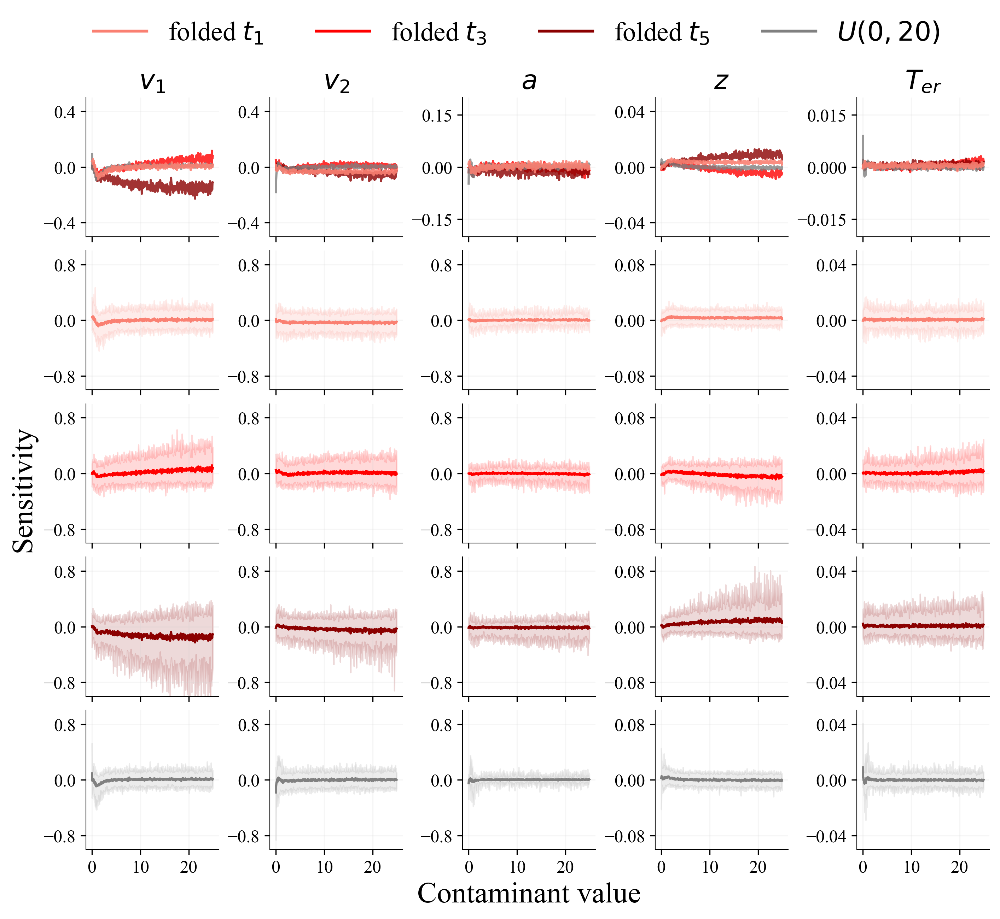

In [12]:
# Setup
xinfl = np.arange(0.01, 25, 0.05)
ylim = [[-1, 1], [-1, 1], [-1, 1], [-0.1, 0.1], [-0.05, 0.05]]
ylim_overlay = [[-0.5, 0.5], [-0.5, 0.5], [-0.2, 0.2] ,[-0.05, 0.05], [-0.02, 0.02]]

titles = [r"$v_1$", r"$v_2$", r"$a$", r"$z$", r"$T_{er}$"]
colors = ["salmon", "red", "darkred", "grey"]
data_list = [
    (infl_t_df1, infl_t_df1_lower, infl_t_df1_upper),
    (infl_t_df3, infl_t_df3_lower, infl_t_df3_upper),
    (infl_t_df5, infl_t_df5_lower, infl_t_df5_upper),
    (infl_uniform, infl_uniform_lower, infl_uniform_upper),
]

plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(9, 8), dpi=300, constrained_layout=True)

def plot_with_ci(ax, x, y, y_lower, y_upper, color, ylim):
    ax.plot(x, y, color=color, linewidth=1.5)
    ax.fill_between(x, y_lower, y_upper, color=color, alpha=0.15)
    ax.set_ylim(ylim)
    ax.grid(color='lightgray', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    ax.yaxis.set_major_locator(MaxNLocator(nbins=3))
    ax.xaxis.set_major_locator(MaxNLocator(nbins=3))

def plot_overlay(ax, x, data_list, col, ylim, colors):
    # Plot all except infl_t_df1 first
    for color, (y, _, _), label in zip(colors[1:], data_list[1:],  [r'folded $t_3$', r'folded $t_5$', r'$U(0, 20)$']):
        ax.plot(x, y[:, col], color=color, linewidth=1.5, alpha=0.8)
    # Plot infl_t_df1 last (on top)
    color, (y, _, _) = colors[0], data_list[0]
    ax.plot(x, y[:, col], color=color, linewidth=1.5, alpha=0.9, label=r'folded $t_1$')
    ax.set_ylim(ylim)
    ax.grid(color='lightgray', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_major_locator(MaxNLocator(nbins=3)) 
    ax.yaxis.set_major_locator(MaxNLocator(nbins=3))
    # Removed ax.legend() here to avoid duplicate legends

# Plot overlays in top row (row 0)
for col in range(5):
    ax = axes[0, col]
    plot_overlay(ax, xinfl, data_list, col, ylim_overlay[col], colors)
    ax.tick_params(labelbottom=False)
    ax.set_title(titles[col], fontsize=18)

# Plot the rest with individual CIs (rows 1–4)
for row in range(1, 5):
    for col in range(5):
        y, y_lower, y_upper = data_list[row - 1]  # Shifted index
        ax = axes[row, col]
        plot_with_ci(ax, xinfl, y[:, col], y_lower[:, col], y_upper[:, col], colors[row - 1], ylim[col])

        if row != 4:
            ax.tick_params(labelbottom=False)

        if row == 4 and col == 2:
            ax.set_xlabel("Contaminant value", fontsize=20)

# Add shared y-axis label
fig.text(-0.03, 0.5, 'Sensitivity', va='center', rotation='vertical', fontsize=20)

# Create custom legend handles
from matplotlib.lines import Line2D
legend_handles = [
    Line2D([0], [0], color="salmon", lw=2, label=r'folded $t_1$'),
    Line2D([0], [0], color="red", lw=2, label=r'folded $t_3$'),
    Line2D([0], [0], color="darkred", lw=2, label=r'folded $t_5$'),
    Line2D([0], [0], color="grey", lw=2, label=r'$U(0, 20)$'),
]

# Add the global legend above the figure
fig.legend(handles=legend_handles, loc='upper center', ncol=4, fontsize=18, bbox_to_anchor=(0.5, 1.08), frameon=False)

# Save and show
#plt.savefig(root_dir/"plots/SSC_DDM_robust.pdf", format="pdf", bbox_inches="tight")
plt.show()


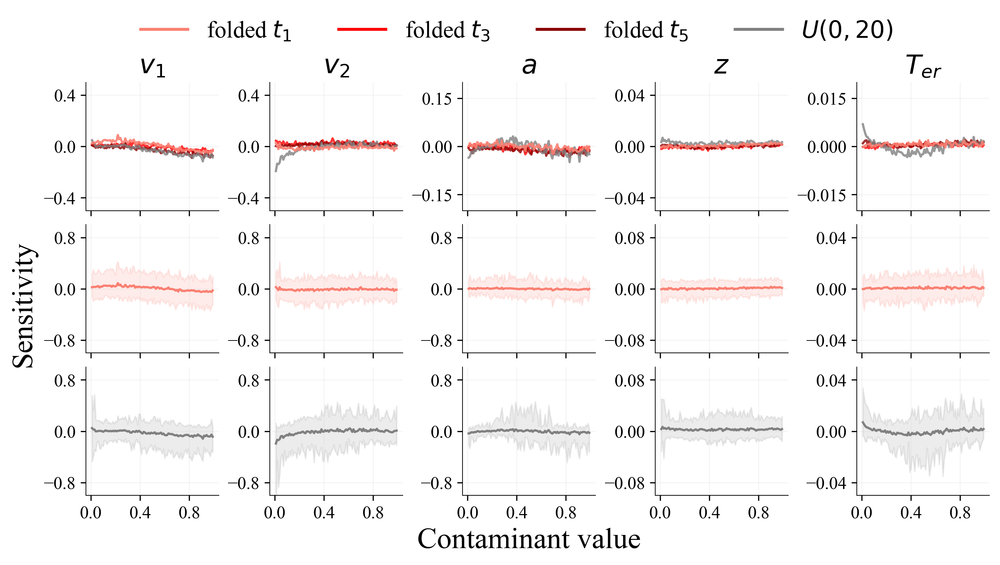

In [13]:
# Setup
xinfl = np.arange(0.01, 1, 0.01)
ylim = [[-1, 1], [-1, 1], [-1, 1], [-0.1, 0.1], [-0.05, 0.05]]
ylim_overlay = [[-0.5, 0.5], [-0.5, 0.5], [-0.2, 0.2], [-0.05, 0.05], [-0.02, 0.02]]
titles = [r"$v_1$", r"$v_2$", r"$a$", r"$z$", r"$T_{er}$"]
colors = ["salmon", "red", "darkred", "grey"]

# Your data
data_list = [
    (infl_t_df1_01, infl_t_df1_01_lower, infl_t_df1_01_upper),
    (infl_t_df3_01, infl_t_df3_01_lower, infl_t_df3_01_upper),
    (infl_t_df5_01, infl_t_df5_01_lower, infl_t_df5_01_upper),
    (infl_uniform_01, infl_uniform_01_lower, infl_uniform_01_upper),
]

# Global font
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

# Create 3x5 subplot grid
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(9, 4.8), dpi=300, constrained_layout=True)

# Plot with confidence interval
def plot_with_ci(ax, x, y, y_lower, y_upper, color, ylim):
    ax.plot(x, y, color=color, linewidth=1.5)
    ax.fill_between(x, y_lower, y_upper, color=color, alpha=0.15)
    ax.set_ylim(ylim)
    ax.grid(color='lightgray', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    ax.yaxis.set_major_locator(MaxNLocator(nbins=3))
    ax.xaxis.set_major_locator(MaxNLocator(nbins=3))

# Overlay plot
def plot_overlay(ax, x, data_list, col, ylim, colors):
    for color, (y, _, _), label in zip(
        colors[1:], data_list[1:], [r'folded $t_3$', r'folded $t_5$', r'$U(0, 20)$']):
        ax.plot(x, y[:, col], color=color, linewidth=1.5, alpha=0.8)
    color, (y, _, _) = colors[0], data_list[0]
    ax.plot(x, y[:, col], color=color, linewidth=1.5, alpha=0.9, label=r'folded $t_1$')
    ax.set_ylim(ylim)
    ax.grid(color='lightgray', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    ax.yaxis.set_major_locator(MaxNLocator(nbins=3))
    ax.xaxis.set_major_locator(MaxNLocator(nbins=3))

# === Plotting ===

# Row 0: overlay
for col in range(5):
    ax = axes[0, col]
    plot_overlay(ax, xinfl, data_list, col, ylim_overlay[col], colors)
    ax.tick_params(labelbottom=False)
    ax.set_title(titles[col], fontsize=18)

# Rows 1 & 2: original row 1 and row 4
rows_to_plot = [1, 4]  # original row indices
for i, original_row in enumerate(rows_to_plot):
    for col in range(5):
        y, y_lower, y_upper = data_list[original_row - 1]  # match with colors
        ax = axes[i + 1, col]  # offset by 1 because row 0 is overlay
        plot_with_ci(ax, xinfl, y[:, col], y_lower[:, col], y_upper[:, col], colors[original_row - 1], ylim[col])
        if i != 1:
            ax.tick_params(labelbottom=False)
        if i == 1 and col == 2:
            ax.set_xlabel("Contaminant value", fontsize=20)

# Shared y-axis label
fig.text(-0.03, 0.5, 'Sensitivity', va='center', rotation='vertical', fontsize=20)

# Legend
legend_handles = [
    Line2D([0], [0], color="salmon", lw=2, label=r'folded $t_1$'),
    Line2D([0], [0], color="red", lw=2, label=r'folded $t_3$'),
    Line2D([0], [0], color="darkred", lw=2, label=r'folded $t_5$'),
    Line2D([0], [0], color="grey", lw=2, label=r'$U(0, 20)$'),
]
fig.legend(handles=legend_handles, loc='upper center', ncol=4, fontsize=16, bbox_to_anchor=(0.5, 1.10), frameon=False)

# Save and show
plt.savefig(root_dir / "plots/SSC_DDM_robust_01.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [3]:
import logging
logging.getLogger().setLevel(logging.ERROR)

xinfl = np.arange(0.01, 25, 0.05)
infl, infl_upper, infl_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer,batch_size = 100)


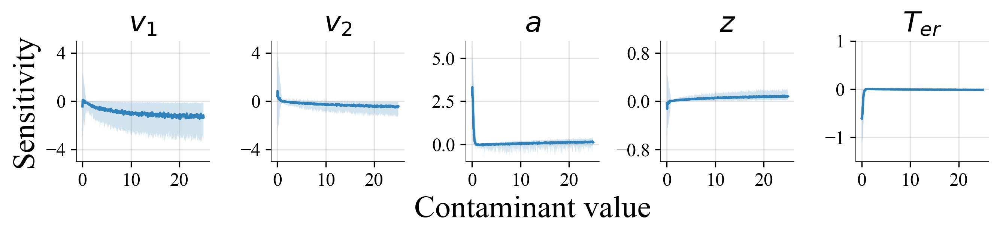

In [17]:
ylim = [[-5,5],[-5,5],[-1,6],[-1,1],[-1.5,1]]
xinfl = np.arange(0.01, 25, 0.05)
plot_ssc(xinfl, infl = infl, infl_upper = infl_upper, infl_lower= infl_lower, ylim = ylim, save_path=root_dir/"plots/SSC_DDM.pdf")


In [15]:
xinfl = np.arange(0.01, 1, 0.01)
infl_01, infl_01_upper, infl_01_lower = compute_ssc(xinfl, trainer=trainer, amortizer = amortizer,batch_size = 100)

Progress:   0%|          | 0/99 [00:00<?, ?it/s]

Stored 'infl_01' (ndarray)
Stored 'infl_01_upper' (ndarray)
Stored 'infl_01_lower' (ndarray)


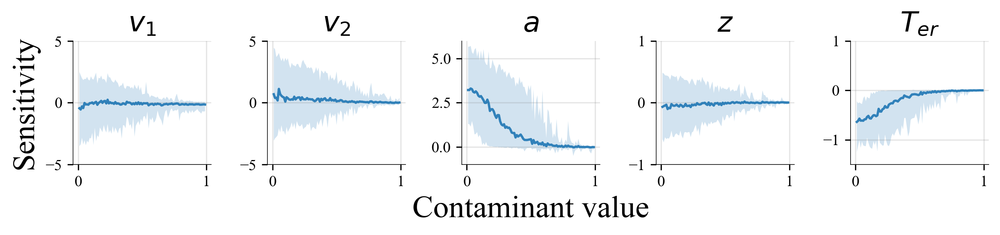

In [28]:
ylim = [[-5,5],[-5,5],[-1,6],[-1,1],[-1.5,1]]
xinfl = np.arange(0.01, 1, 0.01)
plot_ssc(xinfl, infl = infl_01, infl_upper = infl_01_upper, infl_lower= infl_01_lower, ylim = ylim, save_path=root_dir/"plots/SSC_DDM_01.pdf")


## Breakdown point (BP)

In [37]:
def compute_bp(ninfl, model, amortizer, trainer, x_c, batch_size=500,n_samples=100):
   
    nrx = len(ninfl)
    bp = np.zeros(shape=(nrx, 5), dtype=np.float32)
    
    
    for j in tqdm(range(nrx), desc="Progress", leave=False):
        sim_data = model(batch_size=batch_size)
        sim_data['sim_data'][:,0:ninfl[j],0] = np.log(x_c)
        sim_data['sim_data'][:,0:ninfl[j],1] = np.random.binomial(n=1, p=0.5, size=(batch_size,ninfl[j]))
        
        conf_data = trainer.configurator(sim_data)
        
        post_samples = amortizer.sample(conf_data, n_samples=n_samples).astype(np.float32)
        avgpost = np.nanmean(post_samples.astype(np.float32), axis=1, dtype=np.float32)
        
        bp[j, :] = np.mean(avgpost, axis=0)
        
        
        del sim_data, conf_data, post_samples
        if j % 10 == 0:
            gc.collect()  # Manually trigger GC every 10 iterations  # Force garbage collection
    
    return bp

In [ ]:
ninfl = np.arange(1, 101, 1)
bp_t_df1 = compute_bp(ninfl = ninfl, model = model_t_df1, trainer = trainer_t_df1, amortizer = amortizer_t_df1, x_c=0.01)

bp_t_df3 = compute_bp(ninfl = ninfl, model = model_t_df3, trainer = trainer_t_df3, amortizer = amortizer_t_df3, x_c=0.01)

bp_t_df5 = compute_bp(ninfl = ninfl, model = model_t_df5, trainer = trainer_t_df5, amortizer = amortizer_t_df5, x_c=0.01)

bp_uniform = compute_bp(ninfl = ninfl, model = model_uniform, trainer = trainer_uniform, amortizer = amortizer_uniform, x_c=0.01)


In [30]:
def plot_bp(ninfl, bp, no_infl, save_path=None):
    """
    Generate and save a plot for estimation data with highlighted regions and horizontal lines.

    Parameters:
    - ninfl: ndarray
        Array of x-values (e.g., the number of contaminants).
    - infl_flip_R_bp_20: ndarray
        2D array with columns corresponding to the five metrics.
    - no_infl: list or ndarray
        True values for the horizontal reference lines (one for each plot).
    - save_path: str, optional
        File path to save the figure. If None, the figure is not saved.
    """
    fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(9, 2.2))
    plt.subplots_adjust(hspace=0.4, wspace=0.4)
    plt.rcParams['font.family'] = 'Times New Roman'

    ylim = [(-10, 10), (-10, 10), (-10, 10), (0, 1), (-1, 1)]
    hspan = [(0, 7), (-7, 0), (0.5, 5), (0.01, 0.99), (0, 1)]
    titles = PARAM_NAMES

    for i in range(5):
        axes[i].plot(np.arange(0, 1.00, 0.01), bp[:100, i], color='steelblue', alpha=0.9)
        axes[i].set_title(titles[i], size = 18)
        axes[2].set_xlabel('Contaminant fraction', size=18)
        axes[0].set_ylabel('Estimate', size=18)
        axes[i].set_ylim(ylim[i])
        axes[i].set_xticks(np.arange(0, 1.1, 0.5))
        
        # Add horizontal line
        axes[i].axhline(y=no_infl[i], color='red', linestyle='--', label='Horizontal Line')

        # Add highlighted region
        axes[i].axhspan(hspan[i][0], hspan[i][1], color='lightgrey', alpha=0.3)

        # Remove top and right spines
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)

        # Set grey grid
        axes[i].grid(color='grey', linestyle='-', alpha=0.2)

        # Show only bottom and left ticks
        axes[i].xaxis.set_ticks_position('bottom')
        axes[i].yaxis.set_ticks_position('left')

        axes[i].tick_params(axis='x', labelsize=10)
        axes[i].tick_params(axis='y', labelsize=10)

        for spine in axes[i].spines.values():
            spine.set_linewidth(0.4)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()

## BP of standard estimators

In [8]:
ninfl = np.arange(1, 101, 1)
bp = compute_bp(ninfl = ninfl, model = model, trainer = trainer, amortizer = amortizer, x_c=0.01)


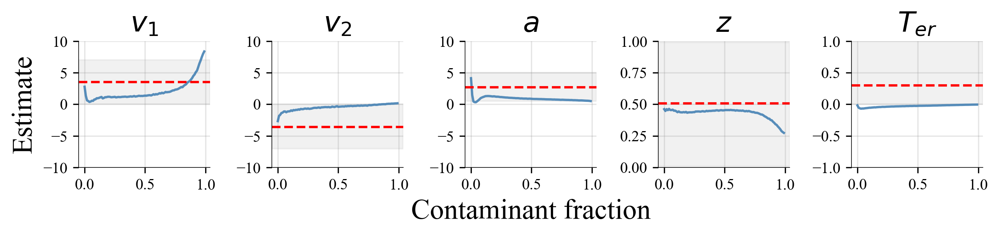

In [31]:
sim_data = model(batch_size=500)
post_sample_orig = amortizer.sample(trainer.configurator(sim_data), n_samples=150)
no_infl = np.mean(np.mean(post_sample_orig, axis=1), axis=0)

plot_bp(ninfl = ninfl, no_infl = no_infl, bp = bp, save_path =root_dir/"plots/BP_DDM.pdf")


In [9]:
bp_20, bp_20_upper, bp_20_lower = compute_bp(ninfl = ninfl, model = model, trainer = trainer, amortizer = amortizer, x_c=20)


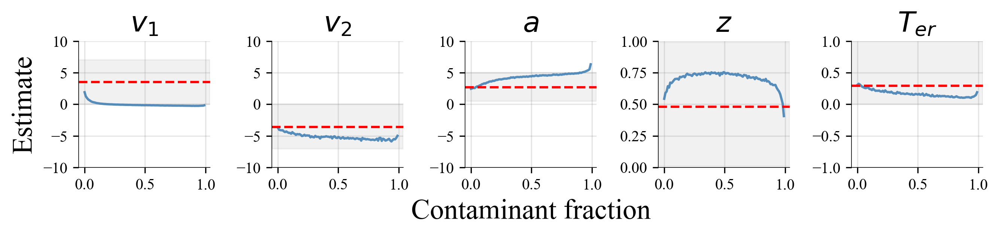

In [32]:
sim_data = model(batch_size=500)
post_sample_orig = amortizer.sample(trainer.configurator(sim_data), n_samples=150)
no_infl = np.mean(np.mean(post_sample_orig, axis=1), axis=0)

plot_bp(ninfl = ninfl, no_infl = no_infl, bp = bp_20, save_path = root_dir/"plots/BP_DDM_20s.pdf")


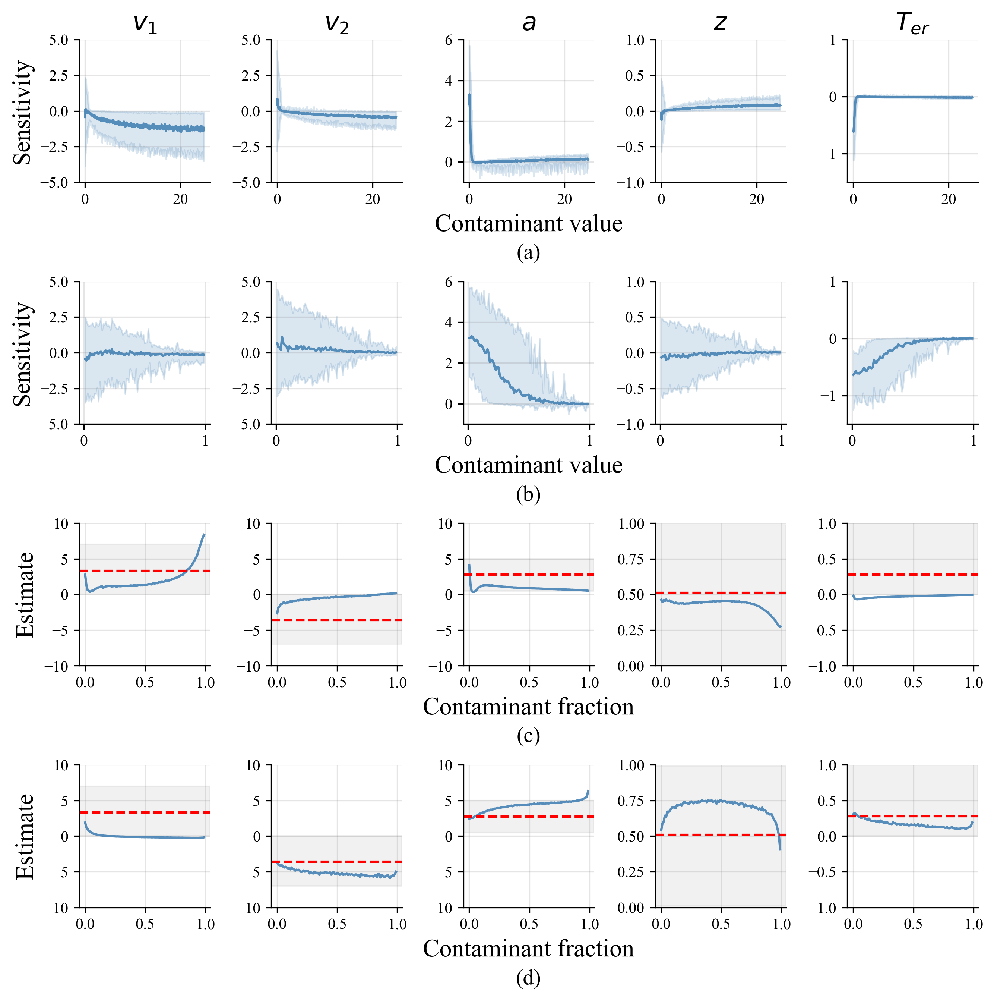

In [79]:
plt.rcParams['font.family'] = 'Times New Roman'

titles = PARAM_NAMES
ylim = [[-5, 5], [-5, 5], [-1, 6], [-1, 1], [-1.5, 1]]
ylim_bp = [(-10, 10), (-10, 10), (-10, 10), (0, 1), (-1, 1)]
hspan = [(0, 7), (-7, 0), (0.5, 5), (0.01, 0.99), (0, 1)]

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(9, 9), dpi=300)
plt.subplots_adjust(hspace=0.6, wspace=0.4)

# Row (a): SSC_DDM
xinfl_1 = np.arange(0.01, 25, 0.05)
for i in range(5):
    ax = axes[0, i]
    ax.plot(xinfl_1, infl[:, i], color='steelblue', alpha=0.9)
    ax.fill_between(xinfl_1, infl_lower[:, i], infl_upper[:, i], color='steelblue', alpha=0.2)
    ax.set_ylim(ylim[i])
    if i == 0:
        ax.set_ylabel('Sensitivity', fontsize=16)
    if i == 2:
        ax.set_xlabel('Contaminant value', fontsize=16)
    ax.set_title(titles[i], fontsize=16)
    ax.grid(color='grey', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(labelsize=10)

# Row (b): SSC_DDM_01
xinfl_2 = np.arange(0.01, 1, 0.01)
for i in range(5):
    ax = axes[1, i]
    ax.plot(xinfl_2, infl_01[:, i], color='steelblue', alpha=0.9)
    ax.fill_between(xinfl_2, infl_01_lower[:, i], infl_01_upper[:, i], color='steelblue', alpha=0.2)
    ax.set_ylim(ylim[i])
    if i == 0:
        ax.set_ylabel('Sensitivity', fontsize=16)
    if i == 2:
        ax.set_xlabel('Contaminant value', fontsize=16)
    #ax.set_title(titles[i], fontsize=14)
    ax.grid(color='grey', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(labelsize=10)

# Row (c): BP_DDM
x_bp = np.arange(0, 1.00, 0.01)
for i in range(5):
    ax = axes[2, i]
    ax.plot(x_bp, bp[:100, i], color='steelblue', alpha=0.9)
    ax.axhline(y=no_infl[i], color='red', linestyle='--', label='No outlier')
    ax.axhspan(hspan[i][0], hspan[i][1], color='lightgrey', alpha=0.3)
    ax.set_ylim(ylim_bp[i])
    ax.set_xticks(np.arange(0, 1.1, 0.5))
    if i == 0:
        ax.set_ylabel('Estimate', fontsize=16)
    if i == 2:
        ax.set_xlabel('Contaminant fraction', fontsize=16)
    #ax.set_title(titles[i], fontsize=14)
    ax.grid(color='grey', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(labelsize=10)

# Row (d): BP_DDM_20s
for i in range(5):
    ax = axes[3, i]
    ax.plot(x_bp, bp_20[:100, i], color='steelblue', alpha=0.9)
    ax.axhline(y=no_infl[i], color='red', linestyle='--', label='No outlier')
    ax.axhspan(hspan[i][0], hspan[i][1], color='lightgrey', alpha=0.3)
    ax.set_ylim(ylim_bp[i])
    ax.set_xticks(np.arange(0, 1.1, 0.5))
    if i == 0:
        ax.set_ylabel('Estimate', fontsize=16)
    if i == 2:
        ax.set_xlabel('Contaminant fraction', fontsize=16)
    #ax.set_title(titles[i], fontsize=14)
    ax.grid(color='grey', linestyle='-', alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(labelsize=10)

# Add (a), (b), (c), (d) labels below each row
row_labels = ['(a)', '(b)', '(c)', '(d)']
for row_idx, label in enumerate(row_labels):
    ax = axes[row_idx, 2]  # middle subplot in the row
    ax.text(0.5, -0.5, label, transform=ax.transAxes,
            fontsize=14, ha='center', va='center')

plt.tight_layout()
#plt.savefig("C:/Users/u0145642/OneDrive - KU Leuven/Desktop/submission-Robust ABI/revision/yw_2025_fig5.pdf", format="pdf", bbox_inches="tight")
plt.show()


## BP of robust estimators

In [12]:
ninfl = np.arange(1, 101, 1)
bp_t_df1 = compute_bp(ninfl = ninfl, model = model_t_df1, trainer = trainer_t_df1, amortizer = amortizer_t_df1, x_c=0.01)

bp_t_df3 = compute_bp(ninfl = ninfl, model = model_t_df3, trainer = trainer_t_df3, amortizer = amortizer_t_df3, x_c=0.01)

bp_t_df5 = compute_bp(ninfl = ninfl, model = model_t_df5, trainer = trainer_t_df5, amortizer = amortizer_t_df5, x_c=0.01)

bp_uniform = compute_bp(ninfl = ninfl, model = model_uniform, trainer = trainer_uniform, amortizer = amortizer_uniform, x_c=0.01)


In [13]:
ninfl = np.arange(1, 101, 1)
bp_t_df1_20 = compute_bp(ninfl = ninfl, model = model_t_df1, trainer = trainer_t_df1, amortizer = amortizer_t_df1, x_c=20)

bp_t_df3_20 = compute_bp(ninfl = ninfl, model = model_t_df3, trainer = trainer_t_df3, amortizer = amortizer_t_df3, x_c=20)

bp_t_df5_20 = compute_bp(ninfl = ninfl, model = model_t_df5, trainer = trainer_t_df5, amortizer = amortizer_t_df5, x_c=20)

bp_uniform_20 = compute_bp(ninfl = ninfl, model = model_uniform, trainer = trainer_uniform, amortizer = amortizer_uniform, x_c=20)


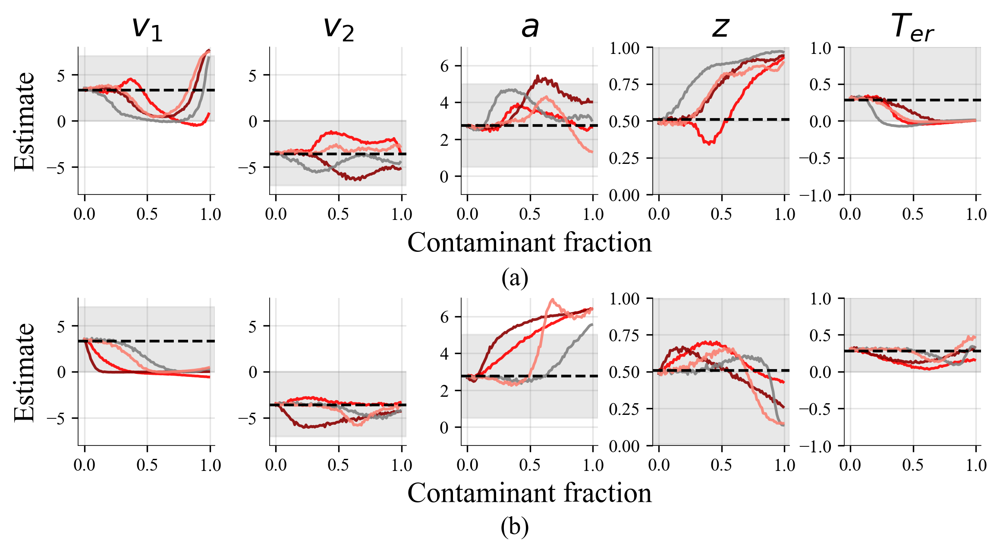

In [112]:
ylim = [(-8,8), (-8,8), (-1,7), (0,1), (-1,1)]
hspan = [(0,7), (-7,0), (0.5,5), (0.01,0.99), (0,2)]
x_vals = np.arange(0, 1.00, 0.01)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(9, 4), dpi=300, sharex='col')

plt.rcParams['font.family'] = 'Times New Roman'
plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.4)
for row in range(2):
    if row == 0:
        bp_t_df1_cur = bp_t_df1
        bp_t_df3_cur = bp_t_df3
        bp_t_df5_cur = bp_t_df5
        bp_uniform_cur = bp_uniform
    else:
        bp_t_df1_cur = bp_t_df1_20
        bp_t_df3_cur = bp_t_df3_20
        bp_t_df5_cur = bp_t_df5_20
        bp_uniform_cur = bp_uniform_20

    for i in range(5):
        ax = axes[row, i]
        ax.set_xticks([0, 0.5, 1])
        ax.plot(x_vals, bp_t_df3_cur[0:100, i], color='red', alpha=0.9)
        ax.plot(x_vals, bp_t_df5_cur[0:100, i], color='darkred', alpha=0.9)
        ax.plot(x_vals, bp_uniform_cur[0:100, i], color='grey', alpha=0.9)
        ax.plot(x_vals, bp_t_df1_cur[0:100, i], color='salmon', alpha=0.9)

        if row == 0:
            ax.set_title(PARAM_NAMES[i], size=18)

        # Set xlabel only on bottom row
        if  i == 2:
            ax.set_xlabel('Contaminant fraction', size=16)

        # Set ylabel only on first column (leftmost) for each row
        if i == 0:
            ax.set_ylabel('Estimate', size=16)

        ax.set_ylim(ylim[i])
        ax.axhline(y=no_infl[i], color='black', linestyle='--')

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(color='grey', linestyle='-', alpha=0.2)

        ax.xaxis.set_ticks_position('bottom')
        ax.yaxis.set_ticks_position('left')
        ax.tick_params(axis='x', labelsize=10)
        ax.tick_params(axis='y', labelsize=10)
        for spine in ax.spines.values():
            spine.set_linewidth(0.4)

        ax.axhspan(hspan[i][0], hspan[i][1], color='lightgrey', alpha=0.5)

# Add row labels (a) and (b) centered below each row:
fig.text(0.5, -0.06, '(b)', ha='center', fontsize=14)
fig.text(0.5, 0.42, '(a)', ha='center', fontsize=14)

#plt.tight_layout(rect=[0, 0.05, 1, 1])  # leave room for the labels below

#plt.savefig("C:/Users/u0145642/OneDrive - KU Leuven/Desktop/submission-Robust ABI/revision/yw_2025_fig10.pdf", format="pdf", bbox_inches="tight")
plt.show()


## The cost of robustness

### Mean absolute error and posterior variance

In [45]:
test_sims = model(batch_size=10000)
def cost(amortizer, n_samples=200):
    post_samples = amortizer.sample(trainer.configurator(test_sims), n_samples=n_samples)
    post_samples_mean = np.mean(post_samples,axis=1)
    true_parameters =  test_sims['prior_draws']
    MAE = np.nanmean(np.abs(true_parameters-post_samples_mean),axis=0)
    VAR = np.nanmean(np.var(post_samples,axis=1),axis=0)
    
    return MAE, VAR

In [46]:
#when estimating clean data
MAE_ddm_standard, VAR_ddm_standard = cost(amortizer=amortizer)
MAE_ddm_df1, VAR_ddm_df1 = cost(amortizer=amortizer_t_df1)
MAE_ddm_df3, VAR_ddm_df3 = cost(amortizer=amortizer_t_df3)
MAE_ddm_df5, VAR_ddm_df5 = cost(amortizer=amortizer_t_df5)
MAE_uniform, VAR_uniform = cost(amortizer=amortizer_uniform)

In [47]:
print(f'ErrorRatio t_1', np.round(MAE_ddm_standard/MAE_ddm_df1,3))
print(f'ErrorRatio t_3', np.round(MAE_ddm_standard/MAE_ddm_df3,3))
print(f'ErrorRatio t_5', np.round(MAE_ddm_standard/MAE_ddm_df5,3))
print(f'ErrorRatio U(0,20)', np.round(MAE_ddm_standard/MAE_uniform,3))

print(f'VarRatio t_1', np.round(VAR_ddm_standard/VAR_ddm_df1,3))
print(f'VarRatio t_3', np.round(VAR_ddm_standard/VAR_ddm_df3,3))
print(f'VarRatio t_5', np.round(VAR_ddm_standard/VAR_ddm_df5,3))
print(f'VarRatio U(0,20)', np.round(VAR_ddm_standard/VAR_uniform,3))

ErrorRatio t_1 [0.754 0.777 0.761 0.874 0.794]
ErrorRatio t_3 [0.73  0.712 0.722 0.859 0.775]
ErrorRatio t_5 [0.723 0.724 0.726 0.854 0.729]
ErrorRatio U(0,20) [0.878 0.882 0.902 0.933 0.858]
VarRatio t_1 [0.622 0.594 0.61  0.734 0.57 ]
VarRatio t_3 [0.643 0.568 0.634 0.697 0.585]
VarRatio t_5 [0.624 0.567 0.673 0.711 0.569]
VarRatio U(0,20) [0.728 0.671 0.724 0.759 0.64 ]


## Manipulate contamination probability $\pi$

In [12]:
##pi=0.01
def diffusion_experiment_001(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.01,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_001 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_001, context_generator=context_gen)

model_001 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_001)

summary_net_001 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

inference_net_001 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_001 = bf.amortizers.AmortizedPosterior(inference_net_001, summary_net_001)


trainer_001 = bf.trainers.Trainer(
    generative_model=model_001, amortizer=amortizer_001, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_001
)
amortizer_001.summary()

##pi=0.05
@nb.jit(nopython=True)

def diffusion_experiment_005(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.05,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_005 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_005, context_generator=context_gen)

model_005 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_005)

summary_net_005 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

inference_net_005 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_005 = bf.amortizers.AmortizedPosterior(inference_net_005, summary_net_005)


trainer_005 = bf.trainers.Trainer(
    generative_model=model_005, amortizer=amortizer_005, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_005
)
amortizer_005.summary()

##pi=0.1
@nb.jit(nopython=True)

def diffusion_experiment_010(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_010 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_010, context_generator=context_gen)

model_010 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_010)

summary_net_010 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

inference_net_010 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_010 = bf.amortizers.AmortizedPosterior(inference_net_010, summary_net_010)


trainer_010 = bf.trainers.Trainer(
    generative_model=model_010, amortizer=amortizer_010, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_010
)
amortizer_010.summary()

##pi=0.2

@nb.jit(nopython=True)

def diffusion_experiment_020(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.20,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_020 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_020, context_generator=context_gen)

model_020 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_020)

summary_net_020 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

inference_net_020 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_020 = bf.amortizers.AmortizedPosterior(inference_net_020, summary_net_020)


trainer_020 = bf.trainers.Trainer(
    generative_model=model_020, amortizer=amortizer_020, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_020
)
amortizer_020.summary()

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.01\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network (Invert  multiple                  434037    
 ibleNetwork)                                                    
                                                                 
 set_transformer_5 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.05\history_101.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_1 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_6 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.10\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_2 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_7 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 200, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.20\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_3 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_8 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


## Parameter recovery

## $\pi$=0.01

Estimation will be performed on data sets with 100 simulated trials.


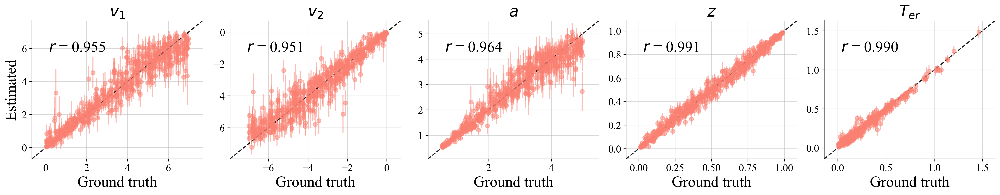

In [25]:
# Generate some validation data
validation_sims = configurator(model_001(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_001.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='salmon',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)
plt.savefig(root_dir/"plots/parameter_recovery_DDM_pi001.pdf", format="pdf", bbox_inches="tight")


## $\pi$=0.05

Estimation will be performed on data sets with 500 simulated trials.


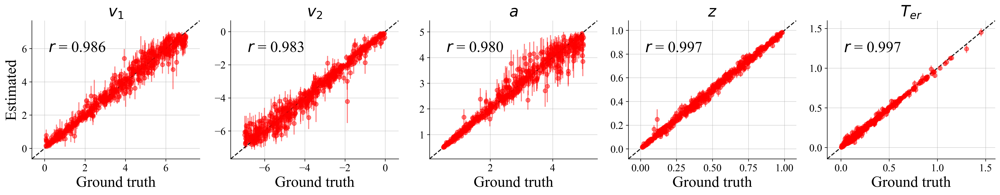

In [128]:
# Generate some validation data
validation_sims = configurator(model_005(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_005.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='red',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_pi005.pdf", format="pdf", bbox_inches="tight")


## $\pi$=0.10

Estimation will be performed on data sets with 500 simulated trials.


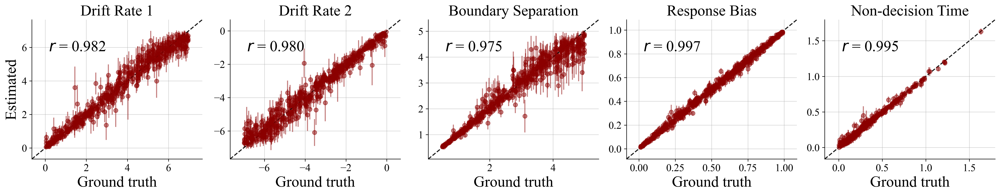

In [67]:
# Generate some validation data
validation_sims = configurator(model_010(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_010.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='darkred',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_pi010.pdf", format="pdf", bbox_inches="tight")


## $\pi$=0.20

Estimation will be performed on data sets with 500 simulated trials.


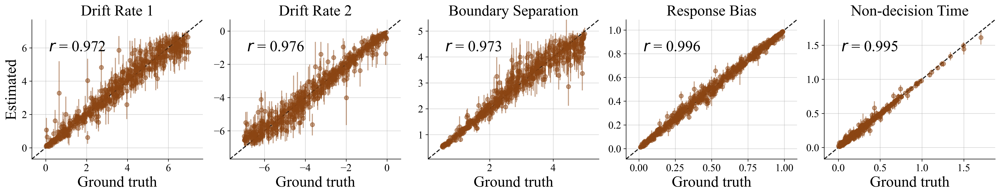

In [68]:
# Generate some validation data
validation_sims = configurator(model_020(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_020.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='saddlebrown',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter_recovery_DDM_pi020.pdf", format="pdf", bbox_inches="tight")


## SSC of robust estimators with different $\pi$

In [5]:
#contaminants range from 0.01 to 20
xinfl = np.arange(0.01, 25, 0.05)
infl_001, infl_001_upper, infl_001_lower = compute_ssc(xinfl, trainer=trainer_001, amortizer = amortizer_001, batch_size = 100)

infl_005, infl_005_upper, infl_005_lower = compute_ssc(xinfl, trainer=trainer_005, amortizer = amortizer_005, batch_size = 100)

infl_010, infl_010_upper, infl_010_lower = compute_ssc(xinfl, trainer=trainer_010, amortizer = amortizer_010, batch_size = 100)

infl_020, infl_020_upper, infl_020_lower = compute_ssc(xinfl, trainer=trainer_020, amortizer = amortizer_020, batch_size = 100)


## BP of robust estimator with different $\pi$

In [6]:
logging.getLogger().setLevel(logging.ERROR)
ninfl = np.arange(1, 101, 1)
bp_001 = compute_bp(ninfl = ninfl, model = model_001, amortizer = amortizer_001, trainer = trainer_001, x_c=0.01)

bp_005 = compute_bp(ninfl = ninfl, model = model_005, amortizer = amortizer_005, trainer = trainer_005, x_c=0.01)

bp_010 = compute_bp(ninfl = ninfl, model = model_010, amortizer = amortizer_010, trainer = trainer_010, x_c=0.01)

bp_020 = compute_bp(ninfl = ninfl, model = model_020, amortizer = amortizer_020, trainer = trainer_020, x_c=0.01)


In [7]:
ninfl = np.arange(1, 101, 1)
bp_001_20 = compute_bp(ninfl = ninfl, model = model_001, amortizer = amortizer_001, trainer = trainer_001, x_c=20)

bp_005_20 = compute_bp(ninfl = ninfl, model = model_005, amortizer = amortizer_005, trainer = trainer_005, x_c=20)

bp_010_20 = compute_bp(ninfl = ninfl, model = model_010, amortizer = amortizer_010, trainer = trainer_010, x_c=20)

bp_020_20 = compute_bp(ninfl = ninfl, model = model_020, amortizer = amortizer_020, trainer = trainer_020, x_c=20)


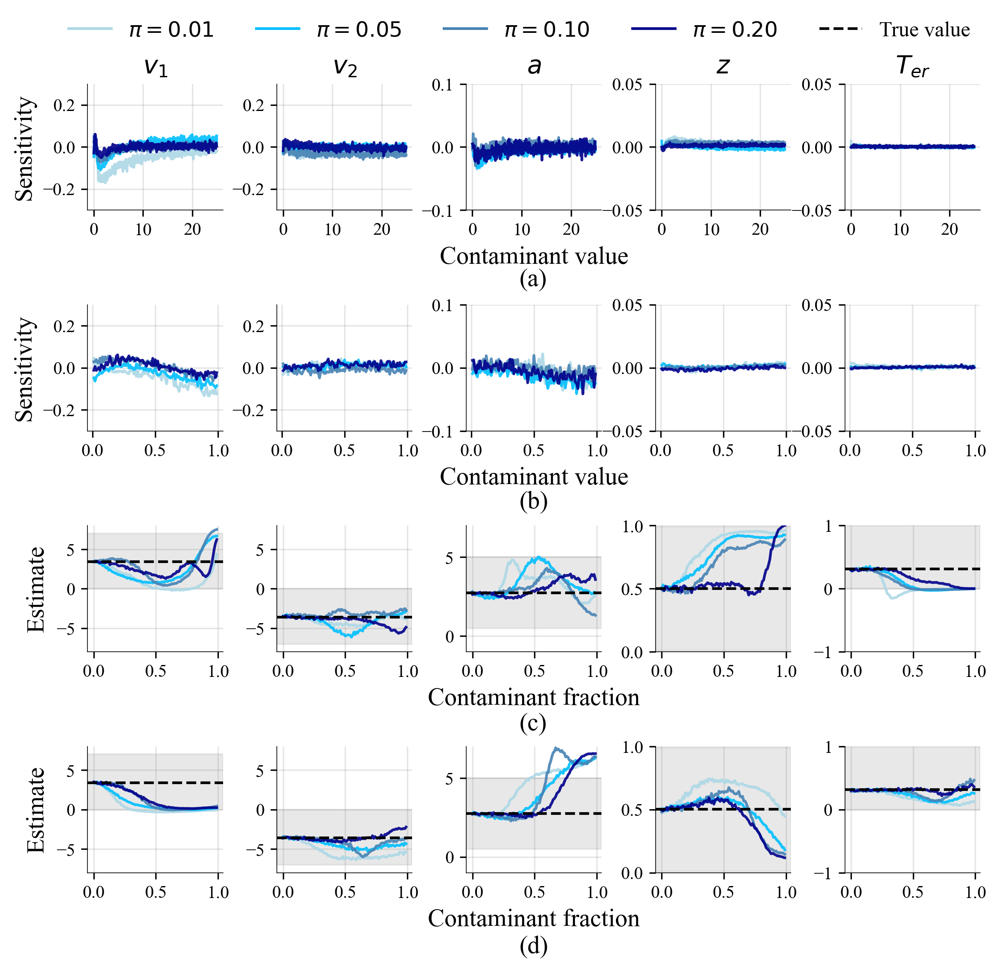

In [133]:
plt.rcParams['font.family'] = 'Times New Roman'

# Set up figure
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(9, 8), dpi=300)
plt.subplots_adjust(hspace=0.75, wspace=0.4)

# --- Setup ---
labels = ['(a)', '(b)', '(c)', '(d)']  # labels for rows
param_labels = PARAM_NAMES
ylim_ssc = [[-0.3,0.3],[-0.3,0.3],[-0.1,0.1],[-0.05,0.05],[-0.05,0.05]]
ylim_bp = [(-8,8),(-8,8),(-1,7),(0,1),(-1,1)]
hspan = [(0,7),(-7,0),(0.5,5),(0.01,0.99),(0,2)]
xinfl_ssc_1 = np.arange(0.01, 25, 0.05)
xinfl_ssc_2 = np.arange(0.01, 1, 0.01)
xinfl_bp = np.arange(0, 1.00, 0.01)

# Reuse no_infl from your code
no_infl = np.mean(np.mean(amortizer.sample(trainer.configurator(model(batch_size=1000)), n_samples=150), axis=1), axis=0)

# --- Plotting each row ---
for row in range(4):
    for col in range(5):
        ax = axes[row, col]
        
        # --- Row 0: SSC_DDM ---
        if row == 0:
            ax.plot(xinfl_ssc_1, infl_001[:, col], color='lightblue', alpha=0.9)
            ax.plot(xinfl_ssc_1, infl_005[:, col], color='deepskyblue', alpha=0.9)
            ax.plot(xinfl_ssc_1, infl_010[:, col], color='steelblue', alpha=0.9)
            ax.plot(xinfl_ssc_1, infl_020[:, col], color='darkblue', alpha=0.9)
            ax.set_ylim(ylim_ssc[col])
            ax.set_xticks([0, 10, 20])
            if col == 0:
                ax.set_ylabel('Sensitivity', size=14)
            if col == 2:
                ax.set_xlabel('Contaminant value', size=14)

        # --- Row 1: SSC_DDM_01 ---
        elif row == 1:
            ax.plot(xinfl_ssc_2, infl_001_01[:, col], color='lightblue', alpha=0.9)
            ax.plot(xinfl_ssc_2, infl_005_01[:, col], color='deepskyblue', alpha=0.9)
            ax.plot(xinfl_ssc_2, infl_010_01[:, col], color='steelblue', alpha=0.9)
            ax.plot(xinfl_ssc_2, infl_020_01[:, col], color='darkblue', alpha=0.9)
            ax.set_ylim(ylim_ssc[col])
            ax.set_xticks([0, 0.5, 1])
            if col == 0:
                ax.set_ylabel('Sensitivity', size=14)
            if col == 2:
                ax.set_xlabel('Contaminant value', size=14)

        # --- Row 2: BP_DDM_0.01s ---
        elif row == 2:
            ax.plot(xinfl_bp, bp_001[0:100, col], color='lightblue', alpha=0.9)
            ax.plot(xinfl_bp, bp_005[0:100, col], color='deepskyblue', alpha=0.9)
            ax.plot(xinfl_bp, bp_010[0:100, col], color='steelblue', alpha=0.9)
            ax.plot(xinfl_bp, bp_020[0:100, col], color='darkblue', alpha=0.9)
            ax.axhline(y=no_infl[col], color='black', linestyle='--')
            ax.axhspan(*hspan[col], color='lightgrey', alpha=0.5)
            ax.set_ylim(ylim_bp[col])
            ax.set_xticks([0, 0.5, 1])
            if col == 0:
                ax.set_ylabel('Estimate', size=14)
            if col == 2:
                ax.set_xlabel('Contaminant fraction', size=14)

        # --- Row 3: BP_DDM_20s ---
        elif row == 3:
            ax.plot(xinfl_bp, bp_001_20[0:100, col], color='lightblue', alpha=0.9)
            ax.plot(xinfl_bp, bp_005_20[0:100, col], color='deepskyblue', alpha=0.9)
            ax.plot(xinfl_bp, bp_010_20[0:100, col], color='steelblue', alpha=0.9)
            ax.plot(xinfl_bp, bp_020_20[0:100, col], color='darkblue', alpha=0.9)
            ax.axhline(y=no_infl[col], color='black', linestyle='--')
            ax.axhspan(*hspan[col], color='lightgrey', alpha=0.5)
            ax.set_ylim(ylim_bp[col])
            ax.set_xticks([0, 0.5, 1])
            if col == 0:
                ax.set_ylabel('Estimate', size=14)
            if col == 2:
                ax.set_xlabel('Contaminant fraction', size=14)

        # Common styling
        if row == 0:
            ax.set_title(param_labels[col], size=14)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(color='grey', linestyle='-', alpha=0.2)
        ax.tick_params(axis='x', labelsize=10)
        ax.tick_params(axis='y', labelsize=10)
        for spine in ax.spines.values():
            spine.set_linewidth(0.4)

# --- Add subplot row labels (a,b,c,d) ---
for row in range(4):
    fig.text(
        0.5,                           # x-position (left side)
        0.7 - row * 0.217,            # y-position (lower than before)
        labels[row],                    # e.g., (a), (b), ...
        fontsize=14,
        va='top'                        # align top of text to the y-position
    )

# Create legend handles and labels separately
handles = [
    plt.Line2D([], [], color='lightblue', label=r'$\pi=0.01$'),
    plt.Line2D([], [], color='deepskyblue', label=r'$\pi=0.05$'),
    plt.Line2D([], [], color='steelblue', label=r'$\pi=0.10$'),
    plt.Line2D([], [], color='darkblue', label=r'$\pi=0.20$'),
    plt.Line2D([], [], color='black', linestyle='--', label='True value')
]

labels = [h.get_label() for h in handles]

# ✅ Fixed call to fig.legend
fig.legend(handles, labels, loc='upper center', ncol=5, bbox_to_anchor=(0.5, 0.96), frameon=False, fontsize=12)

plt.savefig("C:/Users/u0145642/OneDrive - KU Leuven/Desktop/submission-Robust ABI/revision/yw_2025_figA6.pdf", format="pdf", bbox_inches="tight")
plt.show()


## Mean absolute error and variance

In [77]:
test_sims = model(batch_size=10000)
def cost(amortizer, n_samples=200):
    post_samples = amortizer.sample(trainer.configurator(test_sims), n_samples=n_samples)
    post_samples_mean = np.mean(post_samples,axis=1)
    true_parameters =  test_sims['prior_draws']
    MAE = np.nanmean(np.abs(true_parameters-post_samples_mean),axis=0)
    VAR = np.nanmean(np.var(post_samples,axis=1),axis=0)
    
    return MAE, VAR

In [ ]:
#when estimating clean data
MAE_ddm_standard_pi, VAR_ddm_standard_pi = cost(amortizer=amortizer)
MAE_ddm_001, VAR_ddm_001 = cost(amortizer=amortizer_001)
MAE_ddm_005, VAR_ddm_005 = cost(amortizer=amortizer_005)
MAE_ddm_010, VAR_ddm_010 = cost(amortizer=amortizer_010)
MAE_ddm_020, VAR_ddm_020 = cost(amortizer=amortizer_020)

In [80]:
print(f'ErrorRatio pi=0.01', np.round(MAE_ddm_standard_pi/MAE_ddm_df1,3))
print(f'ErrorRatio pi=0.05', np.round(MAE_ddm_standard_pi/MAE_ddm_df3,3))
print(f'ErrorRatio pi=0.10', np.round(MAE_ddm_standard_pi/MAE_ddm_df5,3))
print(f'ErrorRatio pi=0.20', np.round(MAE_ddm_standard_pi/MAE_uniform,3))

print(f'VarRatio pi=0.01', np.round(VAR_ddm_standard_pi/VAR_ddm_001,3))
print(f'VarRatio pi=0.05', np.round(VAR_ddm_standard_pi/VAR_ddm_005,3))
print(f'VarRatio pi=0.10', np.round(VAR_ddm_standard_pi/VAR_ddm_010,3))
print(f'VarRatio pi=0.20', np.round(VAR_ddm_standard_pi/VAR_ddm_020,3))

ErrorRatio pi=0.01 [0.759 0.802 0.777 0.907 0.826]
ErrorRatio pi=0.05 [0.73  0.732 0.735 0.892 0.797]
ErrorRatio pi=0.10 [0.728 0.751 0.741 0.889 0.764]
ErrorRatio pi=0.20 [0.875 0.907 0.916 0.965 0.884]
VarRatio pi=0.01 [0.823 0.807 0.885 0.978 0.864]
VarRatio pi=0.05 [0.72  0.699 0.74  0.819 0.71 ]
VarRatio pi=0.10 [0.617 0.596 0.615 0.734 0.574]
VarRatio pi=0.20 [0.436 0.517 0.531 0.574 0.492]
